<a href="https://colab.research.google.com/github/dshah130/MusicGenreClassification/blob/main/MusicGenres.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Library imports

In [ ]:
#Data imports 
import numpy as np 
import librosa as lr
from glob import glob
import sklearn as skl
import random
import math

#Visualization imports 
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display

#ML imports
from keras.models import Sequential
from keras.layers import Dense,Activation,Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Class and function definitions

In [ ]:
def mean(data):
  return sum(data)/len(data)

In [ ]:
def variance(data):
  n = len(data)
  mean = sum(data)/n
  return sum([(x-mean)**2 for x in data])/n

In [ ]:
class Audio:

  def __init__(self, g, a = []):
    self.genre = g
    self.audio = a
    self.data = []
    self.time = []

  def calc_data(self):
    self.data = []
    self.calc_zero_crossing_rate()
    self.calc_spectral_centroid()
    self.calc_spectral_rolloff()
    self.calc_mfccs()
    self.calc_chromagram()
    self.calc_rms()
    self.calc_tempo()
    
    self.data = np.array(self.data)
    return self.data

  def calc_zero_crossing_rate(self):
    #zero_crossing_rates = np.array_split(lr.feature.zero_crossing_rate(self.audio)[0], 10)
    #for x in zero_crossing_rates:
    x = lr.feature.zero_crossing_rate(self.audio)[0]
    self.data.append(mean(x))
    self.data.append(variance(x))
    #print(len(self.data))

  def calc_spectral_centroid(self):
    #spectral_centroids = np.array_split(lr.feature.spectral_centroid(self.audio, sr=sr)[0], 10)
    #for x in spectral_centroids:
    x = lr.feature.spectral_centroid(self.audio, sr=sr)[0]
    self.data.append(mean(x))
    self.data.append(variance(x))
    #print(len(self.data))
  
  def calc_spectral_rolloff(self):
      x = lr.feature.spectral_rolloff(self.audio)[0]
      self.data.append(mean(x))
      self.data.append(variance(x))
      #print(len(self.data))

  def calc_mfccs(self):
    mfccs = lr.feature.mfcc(self.audio, sr=sr)
    for x in mfccs:
      self.data.append(mean(x))
      self.data.append(variance(x))
    #print(len(self.data))

  def calc_chromagram(self):
    chromagram = lr.feature.chroma_stft(self.audio, sr=sr)
    for x in chromagram:
      self.data.append(mean(x))
      self.data.append(variance(x))
    #print(len(self.data))
  
  def calc_rms(self):
    rms = lr.feature.rms(self.audio)[0]
    self.data.append(mean(rms))
    self.data.append(variance(rms))
    #print(len(self.data))

  def calc_tempo(self):
    onset_env = lr.onset.onset_strength(y=self.audio, sr=sr)
    self.data.append(librosa.beat.tempo(onset_envelope=onset_env, sr=sr)[0])
    #print(len(self.data))

  def play(self):
    ipd.Audio(self.audio, rate=22050) 

In [ ]:
#deprecated, moved into audio.calc* methods
#finds averages for different intervals of the song to generate more test data
def genData(song):
    out = []
    zero_crossing_rates = np.array_split(song.zero_crossing_rate, 10)
    for x in zero_crossing_rates:
      out.append(mean(x))
      out.append(variance(x))
    spectral_rolloffs = np.array_split(song.spectral_rolloff, 10)
    for x in spectral_rolloffs:
      out.append(mean(x))
      out.append(variance(x))
    spectral_centroids = np.array_split(song.spectral_centroid, 10)
    for x in spectral_centroids:
      out.append(mean(x))
      out.append(variance(x))
    #out.append(mean(song.zero_crossing_rate))
    #out.append(variance(song.zero_crossing_rate))
    #out.append(mean(song.spectral_rolloff))
    #out.append(variance(song.spectral_rolloff))
    #out.append(mean(song.spectral_centroid))
    #out.append(variance(song.spectral_centroid))
    for x in song.mfccs:
      out.append(mean(x))
      out.append(variance(x))
    #for x in song.chromagram:
    out.append(mean([mean(x) for x in song.chromagram]))
    out.append(variance([variance(x) for x in song.chromagram]))
    out.append(mean(song.rms))
    out.append(variance(song.rms))
    return(np.array(out))
#

# File imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Drive import part 1: mounting 
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Local file import (as backup to GDrive)
data_location = './Data/genres_original/rock'
audio_files = glob (data_location + '/*.wav')
len(audio_files)

0

In [ ]:
#Drive import part 2: pathing 
Genres = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
audio_files = {}

#data_path = 'content/drive/My Drive/Colab Notebooks/Data/genres_original/rock'

#changed to import each genre into dictionary indexed by genre name
for genre in Genres:
  data_path = '/content/drive/MyDrive/Colab Notebooks/Data/genres_original/' + genre
  audio_files[genre] = glob(data_path + '/*.wav')
#

#data_path = '/content/drive/MyDrive/Colab Notebooks/Data/genres_original/rock'
#audio_files = glob (data_path + '/*.wav')

#sanity check
for genre in Genres:
  print(f"{genre}: {len(audio_files[genre])}")
#

blues: 100
classical: 100
country: 100
disco: 100
hiphop: 100
jazz: 99
metal: 100
pop: 100
reggae: 100
rock: 100


In [ ]:
#Load audio files into numpy array 

#print(all(lr.load(audio_files[genre][song], sr=None)[1] ==22050 for genre in Genres for song in range(len(audio_files[genre]))))
#all of the files have a native sample rate of 22050
#note that jazz 54 was corrupt for me, I'll try redownloading it
sr=22050

audio = {}
#for genre in Genres:
#  audio[genre] = []
#load all the music for all the genres
for genre in Genres:
  print(genre)
#  for song in range(len(audio_files[genre])):
#    for sample in np.array_split(lr.load(audio_files[genre][song], sr=sr), 2):
#      audio[genre].append(Audio(genre, sample))
#  print(len(audio[genre]))
  audio[genre] = np.array([Audio(genre, lr.load(audio_files[genre][song], sr=sr)[0]) for song in range(len(audio_files[genre]))])


T=30
#make time variables for each song in each genre
#for genre in Genres:
#  for song in audio[genre]:
#    song.time = np.linspace(0, T, int(T*sr))
  #time[genre] = [np.arange(0,len(audio[genre][song]))/sr for song in range(len(audio[genre]))]
  #time[genre] = [np.linspace(0, T, int(T*sr)) for song in range(len(audio[genre]))]

#(signal, rate) = lr.load(_wav_file_, sr=48000)
#audio, frequency = lr.load(audio_files['rock'][0], sr=None)
#print(frequency)
#time = np.arange(0, len(audio)) / frequency 
#If steps are non-integer, ie. decimals, might be better to use np.linspace to be more precise. 

blues
classical
country
disco
hiphop
jazz
metal
pop
reggae
rock


In [ ]:
#play any audio clip in the library from indexed by genre and then a number from 0-99
ipd.Audio(audio['metal'][5].audio, rate=sr) 

IndexError: ignored

In [ ]:
## Find sample rate of the data 
#^ found above sr = 22050 for all our samples

# Waveform Visualization

In [ ]:
##Spectrogram organised per genre 
cmap = plt.get_cmap('inferno')
plt.figure(figsize=(8,8))
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
for g in genres:
    pathlib.Path(f'img_data/{g}').mkdir(parents=True, exist_ok=True)
    for filename in os.listdir(f'./drive/My Drive/genres/{g}'):
        songname = f'./drive/My Drive/genres/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=5)
        plt.specgram(y, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
        plt.axis('off');
        plt.savefig(f'img_data/{g}/{filename[:-3].replace(".", "")}.png')
        plt.clf()

In [ ]:
## Creating audio signal using arrays 
sr = 22050 #sample rate
T = 30  #length of audio in seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) #time variable
f = 2020 #frequency of audio signal

x = np.sin(2*np.pi*f*t) #make audio signal
ipd.Audio(x, rate=sr) 

In [ ]:
## Plotting raw data in waveform
fig = plt.figure(figsize=(14,6))
ax1 = fig.add_subplot(211)
ax1.set_title('Waveform of Raw Data')
ax1.set_xlabel('Time')
ax1.set_ylabel('Amptitude')
lr.display.waveplot(audio["metal"][5])
plt.show()

# Feature extraction

In [ ]:
for genre in Genres:
  for song in audio[genre]:
    song.calc

In [ ]:
#Finding zero crossing rate
#Parameters: y : np.ndarry[shape=(n,)], frame_length : int > 0, hop_length : int > 0, 
#centre : bool, kwargs (optional keyword arugments)

#y, sampleRate = librosa.load(librosa.util.audioFile())
#zero_crossing_rates = {}

for genre in Genres:
  for song in audio[genre]:
    song.zero_crossing_rate = lr.feature.zero_crossing_rate(song.audio)[0]
  #zero_crossing_rates[genre] = [lr.feature.zero_crossing_rate(audio[genre][song]) for song in range(len(audio[genre]))]
  print(genre)
#Returns zcr : np.ndarry [shape=(1,t)], zcr[0,i] being the fraction of zero crossings in the i-th frame 



In [ ]:
#spectral_centroids = lr.feature.spectral_centroid(audio["metal"][5], sr=sr)[0]
#print(spectral_centroids.shape)

#find spectral centroids
for genre in Genres:
  for song in audio[genre]:
    song.spectral_centroid = lr.feature.spectral_centroid(song.audio, sr=sr)[0]
#

#change time variable to frame number
for genre in Genres:
  for song in audio[genre]:
    frames = range(len(song.spectral_centroid))
    song.time = lr.frames_to_time(frames)
#

#frames = range(len(spectral_centroids))
#t=lr.frames_to_time(frames)
#print(t.shape)

In [ ]:
#only used for visualization
def normalize(x, axis=0):
  return skl.preprocessing.minmax_scale(x, axis=axis)

In [ ]:
#Spectral rolloff is the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies
#Roll-off freq is calculated such that at minimum, roll_percent(0.85 default) of
#the frame energy spectrum is contained within bins. roll_percent of x→1 can be 
#used to approximate max frequency, as will x→0 with min frequency.
for genre in Genres:
  for song in audio[genre]:
    song.spectral_rolloff = lr.feature.spectral_rolloff(song.audio)[0]
  print(genre)
  #spectral_rolloffs = [lr.feature.spectral_rolloff(audio[gen re][song]) for song in audio[genre]]
#spectral_rolloff = lr.feature.spectral_rolloff(x+0.01, sr=sr)[0]
#lr.display.waveplot(x, sampleRate=sampleRate, alpha=0.4)
#plt.plot(t, normalize(spectral_rolloff), color='r')


In [ ]:
#print waveform with spectral rolloff data
x = audio['rock'][5]
lr.display.waveplot(x.audio, sr=sr, alpha=0.4)
plt.plot(x.time, normalize(x.spectral_rolloff), color='r')

In [ ]:
#mfccs
for genre in Genres:
  for song in audio[genre]:
    song.mfccs = lr.feature.mfcc(song.audio, sr=sr)
print(audio["rock"][5].mfccs.shape)

In [ ]:
#chroma frequencies
for genre in Genres:
  for song in audio[genre]:
    song.chromagram = lr.feature.chroma_stft(song.audio, sr=sr)
print(audio["rock"][5].chromagram.shape)

In [ ]:
for genre in Genres:
  for song in audio[genre]:
    song.rms = lr.feature.rms(song.audio)[0]
print(audio["rock"][5].rms.shape)

# Data formatting

In [ ]:
sr=22050
inputs = []
outputs = []
for genre in Genres:
  print(genre)
  for song in range(len(audio_files[genre])):
    for sample in np.array_split(lr.load(audio_files[genre][song], sr=sr)[0], 10):
      inputs.append(Audio(genre, sample).calc_data())
      o = [0]*len(Genres)
      o[Genres.index(genre)] = 1
      outputs.append(o)

inputs = np.stack(inputs)
outputs = np.array(outputs,dtype=np.float32)

blues
classical
country
disco
hiphop
jazz
metal
pop
reggae
rock


In [ ]:
print(inputs.shape)
print(outputs.shape)

(9990, 73)
(9990, 10)


In [ ]:

#inputs = np.empty([999,108])
#flatten inputs

#print("maybe grab a glass of water or something...")
#print("this is going to take a while")
#for genre in Genres:
#  i = 0
#  for song in audio[genre]:
#    #inputs.append(genData(song))
#    inputs[i] = song.calc_data()
#    i+=1
#    #print(variance(song.mfccs[0]))
#  print(f"{genre}: done")

#inputs = np.stack(inputs)
#

#i=0
#outputs = []
#create lists containing expected outputs for each song
#for i in range(len(Genres)):
#  o = np.array([0]*len(Genres))
#  o[i] = 1

#  for song in audio[Genres[i]]:
#    outputs.append(o) 
#
#outputs = np.array(outputs,dtype=np.float32)

maybe grab a glass of water or something...
this is going to take a while


ValueError: ignored

In [ ]:
##checking
print(inputs[0].shape)
print(inputs)
print(all(i.shape == inputs[0].shape for i in inputs))
for i in inputs:
  if i.shape != inputs[0].shape: 
    print(i.shape)
#

(73,)
[[8.87469952e-02 4.17006222e-03 1.72268656e+03 ... 7.49702514e-02
  2.14420144e-03 9.93840144e+01]
 [3.36726262e-02 1.66667072e-04 1.25323995e+03 ... 4.92982579e-02
  9.78623025e-04 9.93840144e+01]
 [8.09758113e-02 4.01901026e-03 1.54834932e+03 ... 8.98704312e-02
  3.80896708e-03 9.93840144e+01]
 ...
 [1.05596454e-01 6.14813855e-04 2.31661490e+03 ... 1.74094993e-01
  7.82787271e-04 1.23046875e+02]
 [1.03301532e-01 5.97333922e-04 2.27718862e+03 ... 1.71014499e-01
  3.74686170e-04 1.23046875e+02]
 [1.11778846e-01 4.56144683e-04 2.37675333e+03 ... 1.83506431e-01
  2.55666922e-04 1.23046875e+02]]
True


In [ ]:
print(inputs.shape)

(9990, 73)


In [ ]:
print(len(inputs))
print(len(outputs))

9990
9990


In [ ]:
from sklearn.preprocessing import StandardScaler
fit = StandardScaler()
X = fit.fit_transform(inputs)

In [ ]:
#Genre_Map = {"blues":0, "classical":1, "country":2, "disco":3, "hiphop":4, "jazz":5, "metal":6, "pop":7, "reggae":8, "rock":9}

#train-test splitting
training_audio, testing_audio, training_output, testing_output = skl.model_selection.train_test_split(X, outputs, shuffle=True)
#



In [ ]:
print(training_audio.shape, training_output.shape)
print(testing_audio.shape, testing_output.shape)

(7492, 73) (7492, 10)
(2498, 73) (2498, 10)


In [ ]:
#audio_shape = np.concatenate((audio['metal'][5].zero_crossing_rate, audio['metal'][5].spectral_rolloff)).shape
#print(audio['metal'][5].zero_crossing_rate.shape)
#print(audio['metal'][5].spectral_rolloff.shape)
#print(audio_shape)

# Model training and testing

In [ ]:
#create model
model = Sequential()

model.add(Dense(512,input_shape=(training_audio.shape[1],),activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(256,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10,activation='softmax'))


model.summary()
#

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               37888     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [ ]:
print(inputs)

[[8.87469952e-02 4.17006222e-03 1.72268656e+03 ... 7.49702514e-02
  2.14420144e-03 9.93840144e+01]
 [3.36726262e-02 1.66667072e-04 1.25323995e+03 ... 4.92982579e-02
  9.78623025e-04 9.93840144e+01]
 [8.09758113e-02 4.01901026e-03 1.54834932e+03 ... 8.98704312e-02
  3.80896708e-03 9.93840144e+01]
 ...
 [1.05596454e-01 6.14813855e-04 2.31661490e+03 ... 1.74094993e-01
  7.82787271e-04 1.23046875e+02]
 [1.03301532e-01 5.97333922e-04 2.27718862e+03 ... 1.71014499e-01
  3.74686170e-04 1.23046875e+02]
 [1.11778846e-01 4.56144683e-04 2.37675333e+03 ... 1.83506431e-01
  2.55666922e-04 1.23046875e+02]]


In [ ]:
[print(i.shape, i.dtype) for i in model.inputs]
[print(o.shape, o.dtype) for o in model.outputs]
[print(l.name, l.input_shape, l.dtype) for l in model.layers]

(None, 73) <dtype: 'float32'>
(None, 10) <dtype: 'float32'>
dense (None, 73) float32
dropout (None, 512) float32
dense_1 (None, 512) float32
dropout_1 (None, 256) float32
dense_2 (None, 256) float32
dropout_2 (None, 128) float32
dense_3 (None, 128) float32
dropout_3 (None, 64) float32
dense_4 (None, 64) float32


[None, None, None, None, None, None, None, None, None]

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics='accuracy')

earlystop = EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.0001)
modelcheck = ModelCheckpoint('best_model.hdf5',monitor='val_accuracy',verbose=1,save_best_only=True,mode='max')



In [ ]:
history = model.fit(training_audio, training_output, validation_data=(testing_audio, testing_output), epochs=600, callbacks=[earlystop, modelcheck], batch_size=128)

Epoch 1/600
59/59 [==============================] - ETA: 0s - loss: 1.6883 - accuracy: 0.3976
Epoch 1: val_accuracy improved from -inf to 0.60528, saving model to best_model.hdf5
59/59 [==============================] - 2s 15ms/step - loss: 1.6883 - accuracy: 0.3976 - val_loss: 1.1182 - val_accuracy: 0.6053
Epoch 2/600
59/59 [==============================] - ETA: 0s - loss: 1.1433 - accuracy: 0.6021
Epoch 2: val_accuracy improved from 0.60528 to 0.71097, saving model to best_model.hdf5
59/59 [==============================] - 1s 11ms/step - loss: 1.1433 - accuracy: 0.6021 - val_loss: 0.8651 - val_accuracy: 0.7110
Epoch 3/600
54/59 [==========================>...] - ETA: 0s - loss: 0.9469 - accuracy: 0.6765
Epoch 3: val_accuracy improved from 0.71097 to 0.73459, saving model to best_model.hdf5
59/59 [==============================] - 1s 11ms/step - loss: 0.9366 - accuracy: 0.6799 - val_loss: 0.7851 - val_accuracy: 0.7346
Epoch 4/600
59/59 [==============================] - ETA: 0s - l

In [ ]:
# Export model
model.save('/content/drive/MyDrive/finished_model/model')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/finished_model/model/assets


In [ ]:
import tensorflow as tf
loaded_model = tf.keras.models.load_model('/content/drive/MyDrive/finished_model/model')
print(loaded_model.evaluate(testing_audio, testing_output, batch_size=128))

20/20 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8923
[0.4158833920955658, 0.8923138380050659]


# Model visualization

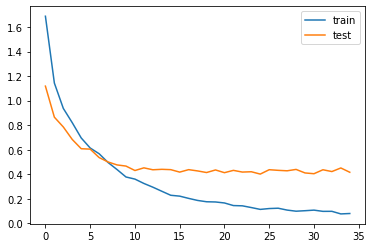

In [ ]:
from matplotlib import pyplot 
pyplot.plot(history.history['loss'], label='train') 
pyplot.plot(history.history['val_loss'], label='test') 
pyplot.legend()
pyplot.show()

In [ ]:
loss, accuracy = model.evaluate(testing_audio, testing_output, batch_size=128)
print(f"Loss : {loss}")
print(f"Best accuracy : {accuracy*100}")

20/20 [==============================] - 0s 3ms/step - loss: 0.4159 - accuracy: 0.8923
Loss : 0.4158833920955658
Best accuracy : 89.23138380050659


# Import and predict new songs

In [ ]:
### An example of the finalized process to predict a song
#make sure you include the audio class in the program and the relevant imports

data_path = '/content/drive/MyDrive/Colab Notebooks/Data/genres_original/test_files'
test_audio_files = glob(data_path + '/*.wav')

test_audio = [Audio("", lr.load(test_audio_files[song], sr=sr)[0]) for song in range(len(test_audio_files))]

samples = []
#for song in test_audio:
#  samples.append(song.calc_data())
samples.append(test_audio[0].calc_data()) #swap this statement for the for loop to do multiple predictions at once

samples = np.stack(samples)

fit = StandardScaler()
samples = fit.fit_transform(samples)

# ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock'] is the order
print(model.predict(samples)*100)

###

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
[[ 1.5534403   0.28942668 15.069626   54.561436    2.194903    0.8457195
   0.5265089   3.5670161  11.887383    9.504538  ]]


In [ ]:
data_path = '/content/drive/MyDrive/Colab Notebooks/Data/genres_original/test_files'
test_audio_files = glob(data_path + '/*.wav')

test_audio = [Audio("", lr.load(test_audio_files[song], sr=sr)[0]) for song in range(len(test_audio_files))]

samples = []
#for song in test_audio:
#  samples.append(song.calc_data())
samples.append(test_audio[0].calc_data())

samples = np.stack(samples)
print(samples.shape)

(1, 73)


In [ ]:
data_path = '/content/drive/MyDrive/Colab Notebooks/Data/genres_original/test_files'
test_audio_files = glob(data_path + '/*.wav')

test_audio = [Audio("", lr.load(test_audio_files[song], sr=sr)[0]) for song in range(len(test_audio_files))]

samples = []

for song in test_audio:
  samples.append(song.calc_data())
#  print(len(song.audio))
#  print(len(song.audio)//(sr*3))
#  #audio_len = len(song.audio)//sr
#  samples.append(np.stack([Audio("", sample).calc_data() for sample in np.array_split(song.audio, len(song.audio)//(sr*3))]))

#  for sample in np.array_split(song.audio, len(song.audio)//(sr*3)):
#      samples.append(Audio("", sample).calc_data())

samples = np.stack(samples)
print([i.shape for i in samples])

[(73,), (73,), (73,)]


In [ ]:
#conv_samples = []

#for sample in samples:
#  fit = StandardScaler()
#  conv_samples.append(fit.fit_transform(sample))


fit = StandardScaler()
samples = fit.fit_transform(samples)

In [ ]:
print(samp)
print()
print(conv_samples[0])

[[-1.13187342  2.65607112 -0.10013701 ... -2.12092302  2.56106854
  -0.87292364]
 [-2.0975737  -0.06787848 -0.34832056 ... -1.7596188  -0.71160983
  -0.87292364]
 [-1.8295751   0.0412184  -0.33841197 ... -1.74664206 -0.6763397
  -0.87292364]
 ...
 [-0.63161975 -0.91911648 -0.9619837  ...  0.60521709  2.70261916
  -0.87292364]
 [-0.74524991 -0.7320471  -1.14688598 ...  0.68168965  3.62619943
   1.78818095]
 [-2.16016394 -1.06796269 -5.54619752 ... -2.20225741  0.26239838
   1.17711248]]

[[-1.13187342  2.65607112 -0.10013701 ... -2.12092302  2.56106854
  -0.87292364]
 [-2.0975737  -0.06787848 -0.34832056 ... -1.7596188  -0.71160983
  -0.87292364]
 [-1.8295751   0.0412184  -0.33841197 ... -1.74664206 -0.6763397
  -0.87292364]
 ...
 [-0.63161975 -0.91911648 -0.9619837  ...  0.60521709  2.70261916
  -0.87292364]
 [-0.74524991 -0.7320471  -1.14688598 ...  0.68168965  3.62619943
   1.78818095]
 [-2.16016394 -1.06796269 -5.54619752 ... -2.20225741  0.26239838
   1.17711248]]


In [ ]:
print(Genres)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [ ]:
#song = audio['rock'][5]
#samples = []
#samples.append(genData(song))
#song = audio['blues'][0]
#samples.append(genData(song))
#samples = np.stack(samples)
#print(samples.shape)

NameError: ignored

In [ ]:
ipd.Audio(test_audio[2].audio, rate=sr) 

In [ ]:
#results = []
#for sample in conv_samples:
#  model_prediction = [0,0,0,0,0,0,0,0,0,0]
#  x = model.predict(sample)
#  for y in x:
#    for i in range(10):
#      model_prediction[i] += y[i]/len(sample)

  #for i in model_prediction:
  #  i = i/len(sample)

#  print(model_prediction)
#  print()
  #results.append(model_prediction)

print(model.predict(samples)*100)

[[ 1.5534403   0.28942668 15.069626   54.561436    2.194903    0.8457195
   0.5265089   3.5670161  11.887383    9.504538  ]]


In [ ]:
print(results)

[[array([7.96754718e-01, 4.22158220e-04, 9.46272412e-05, 1.03222425e-04,
       5.40595676e-04, 2.01297611e-01, 2.20289337e-04, 1.22655492e-05,
       2.41316957e-04, 3.13148310e-04], dtype=float32), array([8.1323742e-05, 2.4032823e-03, 6.9029520e-06, 3.8665237e-07,
       6.9003096e-07, 9.9750227e-01, 8.2073292e-08, 1.7387505e-06,
       1.5873155e-06, 1.7087682e-06], dtype=float32), array([1.7358732e-05, 1.5156847e-04, 1.4326426e-07, 7.1247532e-09,
       1.8225510e-08, 9.9983072e-01, 2.0239155e-09, 1.4183865e-08,
       3.2958855e-08, 1.0443819e-07], dtype=float32), array([5.91761545e-06, 2.66314310e-04, 3.86362274e-07, 1.74758465e-08,
       3.19304156e-08, 9.99726951e-01, 1.67139935e-09, 1.01175864e-07,
       1.01051860e-07, 1.11622327e-07], dtype=float32), array([1.1612674e-05, 3.6088536e-06, 1.3994092e-04, 9.4105875e-01,
       3.2537305e-03, 4.4466688e-06, 1.0922543e-04, 3.7855882e-04,
       5.4740936e-02, 2.9929465e-04], dtype=float32), array([1.9258095e-04, 8.1081651e-03, 2

# Deployment

In [ ]:
# Assigning index to genre
def find_genre(prediction):
    max_index = np.argmax(prediction, axis=1)
    genre = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

    if max_index == 0:
        return genre[0]

    elif max_index == 1:
        return genre[1]

    elif max_index == 2:
        return genre[2]

    elif max_index == 3:
        return genre[3]

    elif max_index == 4:
        return genre[4]

    elif max_index == 5:
        return genre[5]

    elif max_index == 6:
        return genre[6]

    elif max_index == 7:
        return genre[7]

    elif max_index == 8:
        return genre[8]

    elif max_index == 9:
        return genre[9]

In [ ]:
''' 
Some imports my be repeated 
These are just the required import for the deployment
'''

import numpy as np
import librosa as lr
from sklearn.preprocessing import StandardScaler
from flask import Flask, request, render_template
from keras.models import load_model
import os
import random

app = Flask(__name__)

# Define home page
@app.route('/')
def home():
    return render_template('index.html') # Should be in Template folder

# Define prediction page
@app.route('/predict', methods=['GET', 'POST'])
def predict():
    model = load_model('/content/drive/MyDrive/finished_model/model')
    fit = StandardScaler()
    sample = []

    data_path = str(random.randint(0, 10000))
    submitted_file = request.files['TestAudio']
    submitted_file.save(data_path)

    audio = Audio('', lr.load(data_path, sr=sr)[0])
    sample.append(audio.calc_data())
    sample = np.stack(sample)
    sample = fit.fit_transform(sample)

    prediction = model.predict(sample)
    prediction = find_genre(prediction)
    os.remove(data_path)

    prediction_text = f'The song is predicted to be in the {prediction} genre.'

    return render_template('index.html', prediction_text=prediction_text)

if __name__ == '__main__':
    app.run()

Citation for Librosa
Brian McFee, Alexandros Metsai, Matt McVicar, Stefan Balke, Carl Thomé, Colin Raffel, Frank Zalkow, Ayoub Malek, Dana, Kyungyun Lee, Oriol Nieto, Dan Ellis, Jack Mason, Eric Battenberg, Scott Seyfarth, Ryuichi Yamamoto, viktorandreevichmorozov, Keunwoo Choi, Josh Moore, … Thassilo. (2021). librosa/librosa: 0.8.1rc2 (0.8.1rc2). Zenodo. https://doi.org/10.5281/zenodo.4792298

